# Programming Project #2: Image Quilting

## CS445: Computational Photography - Fall 2020


In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import random
import time

datadir = ""

utilfn = datadir + "utils.py"
!cp "$utilfn" .
samplesfn = datadir + "samples"
!cp -r "$samplesfn" .
import utils

cp: ./utils.py and utils.py are identical (not copied).
cp: ./samples and samples are identical (not copied).


In [3]:
from utils import cut # default cut function for seam finding section

### Part I: Randomly Sampled Texture (10 pts)

In [4]:
def quilt_random(sample, out_size, patch_size):

    #create a new image with the size of out_size
    new_image = np.zeros((out_size, out_size, 3), dtype=sample.dtype)
    
    # X/Y size of my sample patch - used for calculations
    sample_size = sample.shape

    #How many iterations will I have to do of this patch size to fill in the image
    iterations = out_size // patch_size

    # Repeat this process every *iteration* times vertically and horizontally
    for r in range(iterations): # blocks of rows 
        for c in range(iterations): #blocks of columns
            # Take my patch by slicing the sample using my new random coordinates 
            last_pixel = sample_size[0] - patch_size - 1
            column_pixel = random.randint(0, last_pixel)
            row_pixel = random.randint(0, last_pixel)
            random_patch = sample[row_pixel:row_pixel+patch_size,column_pixel:column_pixel+patch_size,:]
            
            # Calculate the starting point and end point of the coordinates which I'll change for the 
            # output image 
            next_pixel_i_start = r * patch_size
            next_pixel_i_end = next_pixel_i_start + patch_size 
            next_pixel_j_start = c * patch_size
            next_pixel_j_end = next_pixel_j_start + patch_size
            
            # Update the output image with the patch acquired from 
            new_image[next_pixel_i_start:next_pixel_i_end,next_pixel_j_start:next_pixel_j_end] = random_patch
    return new_image

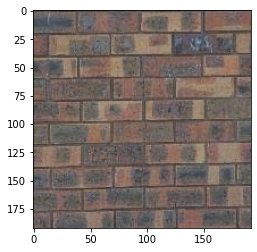

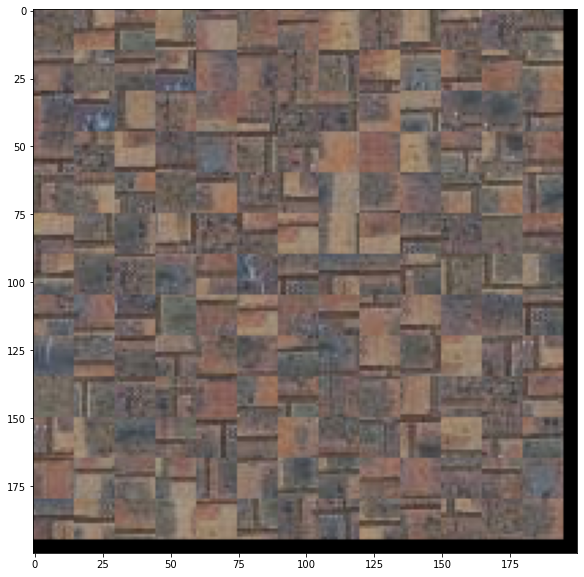

In [19]:
sample_img_fn = 'samples/bricks_small.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 200
patch_size = 15 
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

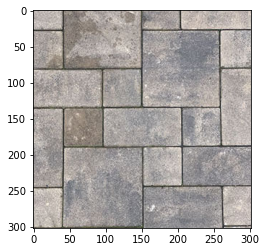

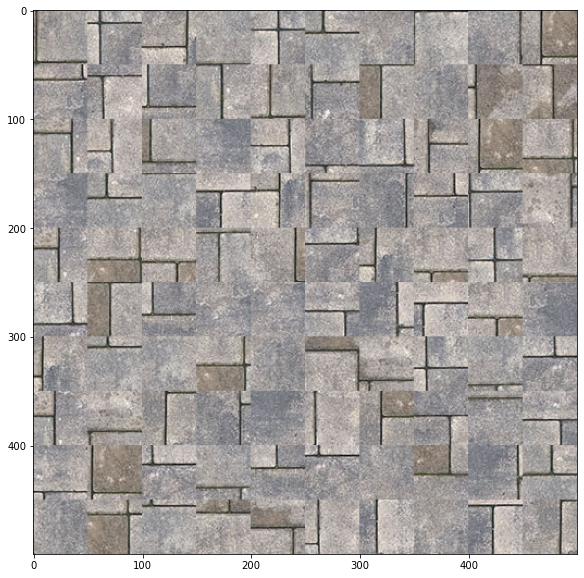

In [6]:
sample_img_fn = 'samples/pavers.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)

plt.imshow(sample_img)
plt.show()

out_size = 500 
patch_size = 50 
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

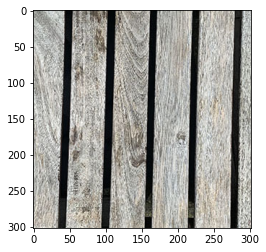

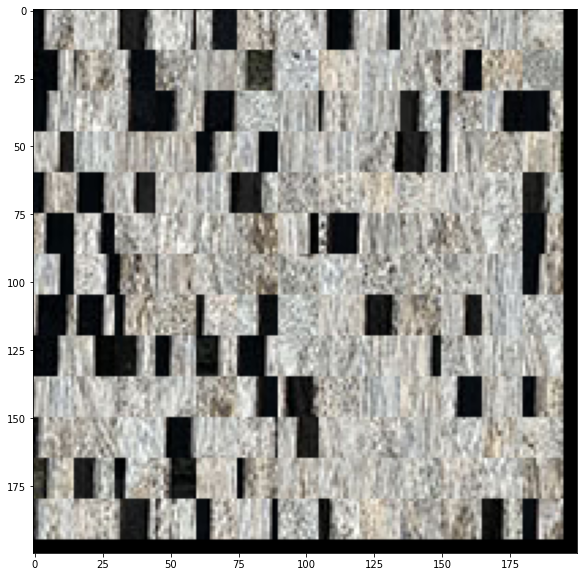

In [20]:
sample_img_fn = 'samples/table.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 200
patch_size = 15 
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

### Part II: Overlapping Patches (30 pts)

In [8]:
def quilt_simple(sample, out_size, patch_size, overlap, tol):
    #create a new image with the size of out_size
    new_image = np.zeros((out_size, out_size, 3), dtype=sample.dtype)
    
    # X/Y size of my sample patch - used for calculations
    sample_size = sample.shape
    #print(sample_size)

    #How many iterations will I have to do of this patch size to fill in the image
    iterations = (out_size // (patch_size - overlap)) - 1

    # Repeat this process every *iteration* times vertically and horizontally
    for r in range(iterations): # blocks of rows 
        for c in range(iterations): #blocks of columns
            # Take my patch by slicing the sample using my new random coordinates 
            last_pixel = sample_size[0] - patch_size - 1
            row_pixel_sample = random.randint(0, last_pixel)
            column_pixel_sample = random.randint(0, last_pixel)
            
            # This is the random patch
            random_patch = sample[row_pixel_sample:row_pixel_sample+patch_size,column_pixel_sample:column_pixel_sample+patch_size,:]
            
            # Calculate the starting point and end point of the coordinates which I'll change for the 
            # output image 
            # if this is the first time, don't apply an overlap to the coordinates            
            if (r == 0): #this is the first row, so no overlap in the top
                row_pixel_sample_patch_start = r * patch_size
            else: #if this is not the first row, apply the overlap
                row_pixel_sample_patch_start = r * (patch_size - overlap)

            row_pixel_sample_patch_end = row_pixel_sample_patch_start + patch_size
            
            if (c == 0): # this is the first column, so no overlap to the left
                column_pixel_sample_patch_start = c * patch_size
            else: #if this is not the firt column, apply the overlap
                column_pixel_sample_patch_start = c * (patch_size - overlap)

            column_pixel_sample_patch_end = column_pixel_sample_patch_start + patch_size
            
            # The template is the patch in the current output image that is to be filled in
            template = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end]

            # Calculate the cost of sampling each patch. 
            # Don't need to do this in the upper-left corner, just the other ones 
            if not ((r==0) and (c==0)):
                mask = np.zeros((patch_size,patch_size), dtype=np.int)
                if (r > 0): 
                    # apply the mask on the top
                    mask[0:overlap,:] = 1
                if (c > 0):
                    #apply the mask on the left
                    mask[:,0:overlap] = 1
                
                ssd_image = ssd_patch(template, sample, mask)
                half_patch_size = (int)((patch_size - 1) /2)
                
                a, b = choose_sample(ssd_image, tol, half_patch_size)
                
                a1 = a - half_patch_size
                b1 = b - half_patch_size
                
                new_patch = sample[a1:a1+patch_size,b1:b1+patch_size,:]
                
                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end, column_pixel_sample_patch_start:column_pixel_sample_patch_end] = new_patch
            else:
                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end] = random_patch
  
    return new_image

def ssd_patch(template, image, mask):

    # I'll make copies of the objects in case I need to change them
    t = template.copy().astype(np.float64)
    i = image.copy().astype(np.float64) 
    m = mask.copy().astype(np.float64)

    ssd_r = ((m*t[:,:,0])**2).sum() - 2 * cv2.filter2D(i[:,:,0], ddepth=-1, kernel = m*t[:,:,0]) + cv2.filter2D(i[:,:,0]** 2, ddepth=-1, kernel=m)
    ssd_g = ((m*t[:,:,1])**2).sum() - 2 * cv2.filter2D(i[:,:,1], ddepth=-1, kernel = m*t[:,:,1]) + cv2.filter2D(i[:,:,1]** 2, ddepth=-1, kernel=m)
    ssd_b = ((m*t[:,:,2])**2).sum() - 2 * cv2.filter2D(i[:,:,2], ddepth=-1, kernel = m*t[:,:,2]) + cv2.filter2D(i[:,:,2]** 2, ddepth=-1, kernel=m)
    ssd_cost = ssd_r + ssd_g + ssd_b
   
    return ssd_cost

def choose_sample(cost_image, tol, borders):
    
    #Set pixels in the borders to inf because they cannot be picked
    cost_image[0:borders,:] = np.inf
    cost_image[cost_image.shape[0] - borders:,:] = np.inf
    cost_image[:,0:borders] = np.inf
    cost_image[:,cost_image.shape[0] - borders:] = np.inf
    
    if (tol > 1):
        chosen_cost = random.randint(0, tol-1)
    else:
        chosen_cost = 1

    indexes = np.unravel_index(np.argsort(cost_image.flatten(), None)[chosen_cost], cost_image.shape)

    return indexes #cost_image_result

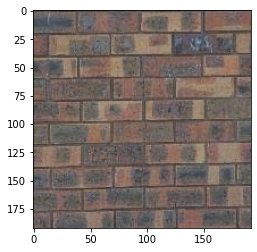

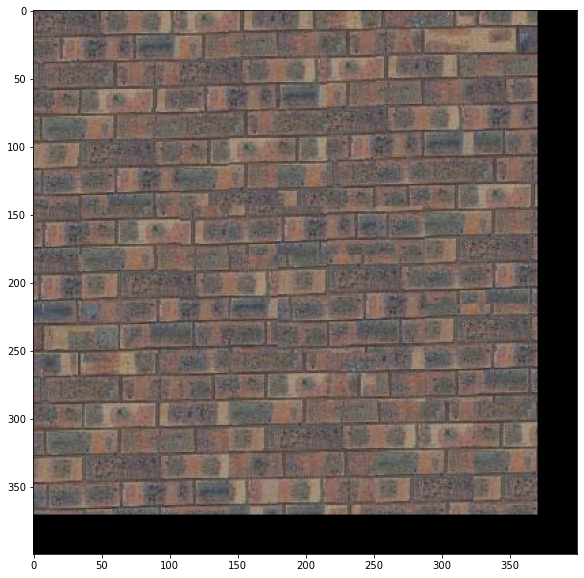

In [9]:
sample_img_fn = 'samples/bricks_small.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 400
patch_size = 47
overlap = 11
tol = 1
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

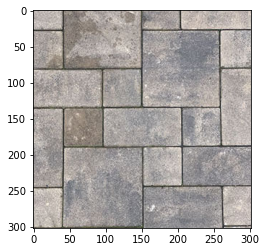

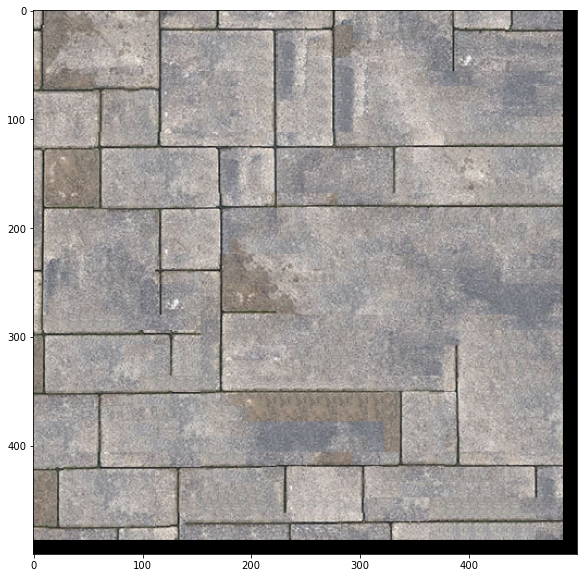

In [10]:
sample_img_fn = 'samples/pavers.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 500 
patch_size = 25
overlap = 11
tol = 3
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

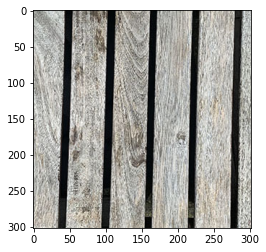

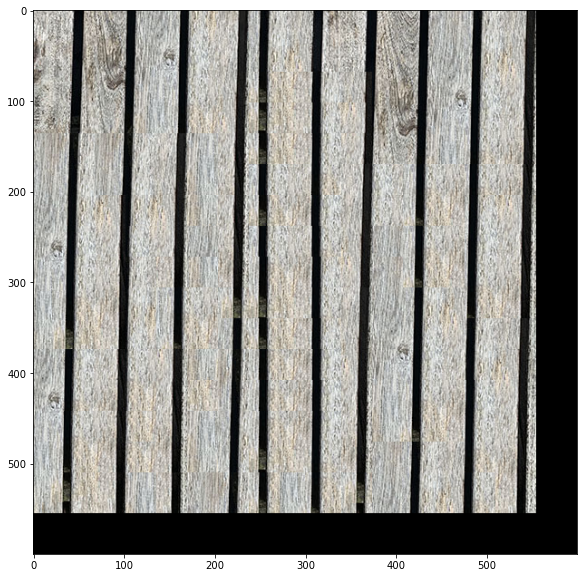

In [11]:
sample_img_fn = 'samples/table.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 600
patch_size = 45
overlap = 11
tol = 3
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

### Part III: Seam Finding (20 pts)


In [37]:
def quilt_cut(sample, out_size, patch_size, overlap, tol):

    #create a new image with the size of out_size
    new_image = np.zeros((out_size, out_size, 3), dtype=sample.dtype)
    
    # X/Y size of my sample patch - used for calculations
    sample_size = sample.shape

    #How many iterations will I have to do of this patch size to fill in the image
    iterations = (out_size // (patch_size - overlap)) - 1

    # Repeat this process every *iteration* times vertically and horizontally
    for r in range(iterations): # blocks of rows 
        for c in range(iterations): #blocks of columns
            # Take my patch by slicing the sample using my new random coordinates 
            last_pixel = sample_size[0] - patch_size - 1
            row_pixel_sample = random.randint(0, last_pixel)
            column_pixel_sample = random.randint(0, last_pixel)
            
            # This is the random patch
            random_patch = sample[row_pixel_sample:row_pixel_sample+patch_size,column_pixel_sample:column_pixel_sample+patch_size,:]
            
            # Calculate the starting point and end point of the coordinates which I'll change for the 
            # output image 
            # if this is the first time, don't apply an overlap to the coordinates
            
            if (r == 0): #this is the first row, so no overlap in the top
                row_pixel_sample_patch_start = r * patch_size
            else: #if this is not the first row, apply the overlap
                row_pixel_sample_patch_start = r * (patch_size - overlap)

            row_pixel_sample_patch_end = row_pixel_sample_patch_start + patch_size
            
            if (c == 0): # this is the first column, so no overlap to the left
                column_pixel_sample_patch_start = c * patch_size
            else: #if this is not the firt column, apply the overlap
                column_pixel_sample_patch_start = c * (patch_size - overlap)

            column_pixel_sample_patch_end = column_pixel_sample_patch_start + patch_size
            
            # The template is the patch in the current output image that is to be filled in
            template = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end]

            # Calculate the cost of sampling each patch. 
            # Don't need to do this in the upper-left corner, just the other ones 
            if not ((r==0) and (c==0)):
                mask = np.zeros((patch_size,patch_size), dtype=np.int)
                if (r > 0): 
                    # apply the mask on the top
                    mask[0:overlap,:] = 1
                if (c > 0):
                    #apply the mask on the left
                    mask[:,0:overlap] = 1
                
                ssd_image = ssd_patch(template, sample, mask)
                
                half_patch_size = (int)((patch_size - 1) /2)                
                a, b = choose_sample(ssd_image, tol, half_patch_size)
                
                a1 = a - half_patch_size #a + row_pixel_sample - 1 - half_patch_size 
                b1 = b - half_patch_size #b + column_pixel_sample - 1 - half_patch_size
                new_patch = sample[a1:a1+patch_size,b1:b1+patch_size,:]
                
                if (r > 0): 
                    # Horizontal overlap
                    overlap_region = new_patch[0:patch_size,:]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_start + patch_size,column_pixel_sample_patch_start:column_pixel_sample_patch_end]
                    existing[existing==0] = overlap_region[existing==0]
                    cost_r = (overlap_region[:,:,0] - existing[:,:,0]) ** 2
                    cost_g = (overlap_region[:,:,1] - existing[:,:,1]) ** 2
                    cost_b = (overlap_region[:,:,2] - existing[:,:,2]) ** 2
                    bndcost = cost_r + cost_g + cost_b
                    
                    horizontal_mask = cut(bndcost)
                if (c > 0):
                    # vertical overlap
                    overlap_region = new_patch[:,0:patch_size]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end ,column_pixel_sample_patch_start:column_pixel_sample_patch_start + patch_size]
                    existing[existing==0] = overlap_region[existing==0]
                    cost_r = (overlap_region[:,:,0] - existing[:,:,0]) ** 2
                    cost_g = (overlap_region[:,:,1] - existing[:,:,1]) ** 2
                    cost_b = (overlap_region[:,:,2] - existing[:,:,2]) ** 2
                    bndcost = cost_r + cost_g + cost_b
                    
                    vertical_mask = cut(bndcost.T).T
                    
                if ((r > 0) and (c > 0)):
                    overlap_region = new_patch[0:patch_size:,0:patch_size]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_start + patch_size, column_pixel_sample_patch_start:column_pixel_sample_patch_start + patch_size]
                    existing[existing==0] = overlap_region[existing==0]
                    
                if ((r > 0) and (c > 0)):
                    cut_mask = np.logical_and(horizontal_mask, vertical_mask)
                    final_patch = existing.copy()
                    final_patch[cut_mask==1] = new_patch[cut_mask==1]
                elif (r > 0):
                    final_patch = existing.copy()
                    final_patch[horizontal_mask==1] = new_patch[horizontal_mask==1]
                elif (c > 0):
                    final_patch = existing.copy()
                    final_patch[vertical_mask==1] = new_patch[vertical_mask==1]
                    
                # I'll plot some information here for a selected patch as required in the project report
                if ((r == 4) and (c == 4)):
                    # Illustration: for a selected patch, display 
                    # (a) the two overlapping portions; 
                    # (b) pixelwise SSD cost; 
                    # (c) horizontal mask; 
                    # (d) vertical mask; 
                    # (e) combination mask.
                    
                    fig, axes = plt.subplots(2, 3, figsize=(15,15))
                    axes[0,0].imshow(template)
                    axes[0,0].set_title('Template', fontsize=24)
                    axes[0,1].imshow(random_patch)
                    axes[0,1].set_title('New patch (random)', fontsize=24)
                    axes[0,2].imshow(ssd_image)
                    axes[0,2].set_title('SSD Cost', fontsize=24)
                    axes[1,0].imshow(horizontal_mask, cmap='gray')
                    axes[1,0].set_title('Horizontal mask', fontsize=24)
                    axes[1,1].imshow(vertical_mask, cmap='gray')
                    axes[1,1].set_title('Vertical mask', fontsize=24)
                    axes[1,2].imshow(cut_mask, cmap='gray')
                    axes[1,2].set_title('Combination mask', fontsize=24)
                    fig.tight_layout()
                
                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end, column_pixel_sample_patch_start:column_pixel_sample_patch_end] = final_patch
            else:
                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end] = random_patch
   
    return new_image

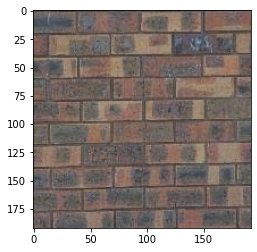

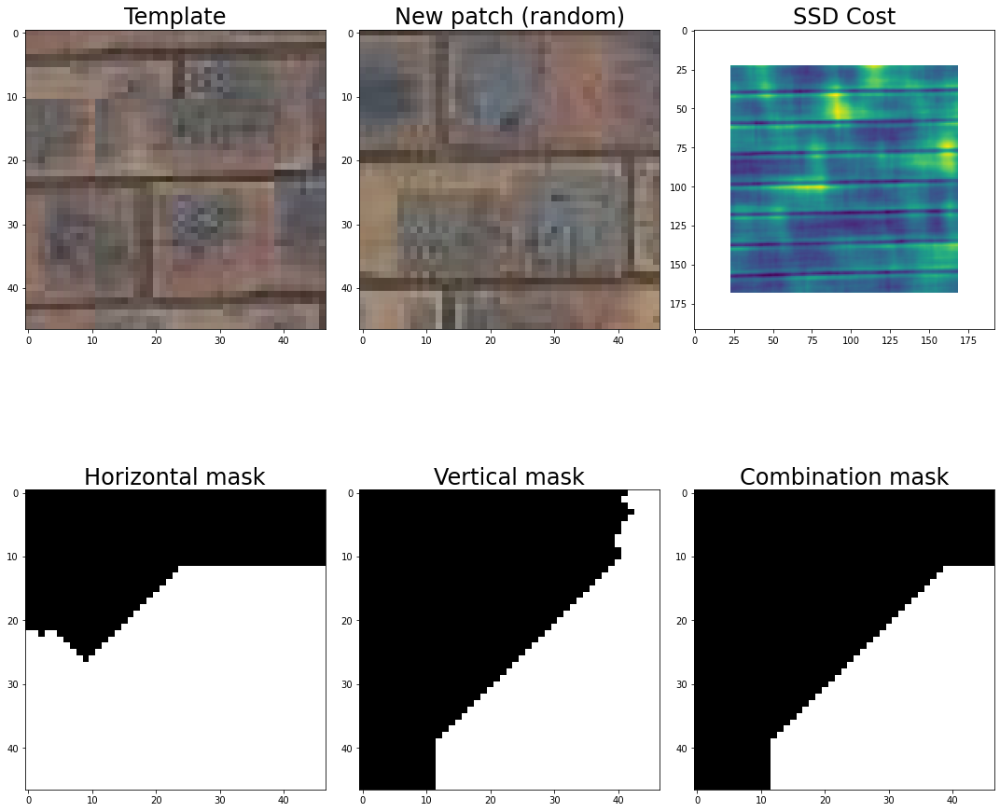

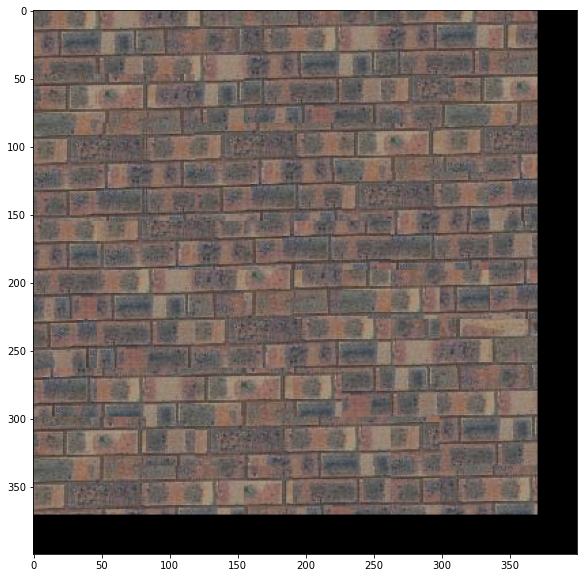

In [42]:
sample_img_fn = 'samples/bricks_small.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 400 
patch_size = 47
overlap = 11
tol = 2
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

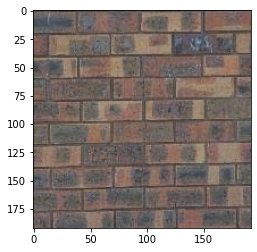

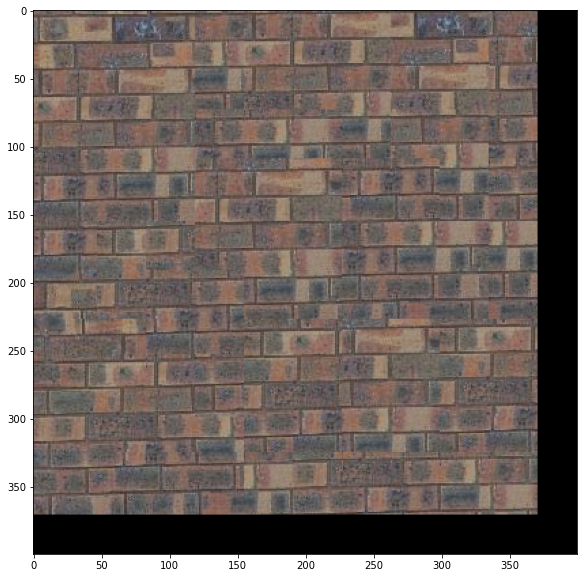

In [13]:
sample_img_fn = 'samples/bricks_small.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 400 
patch_size = 47
overlap = 11
tol = 2
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

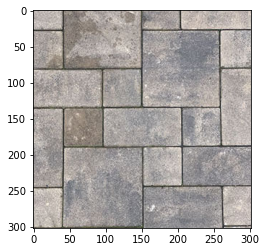

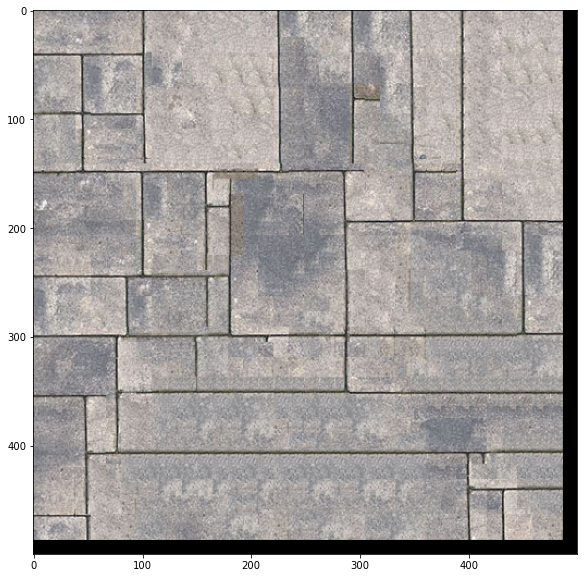

In [14]:
sample_img_fn = 'samples/pavers.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 500
patch_size = 25
overlap = 11
tol = 3
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

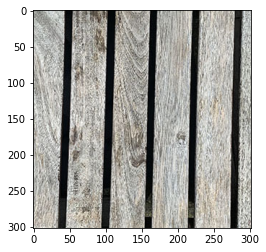

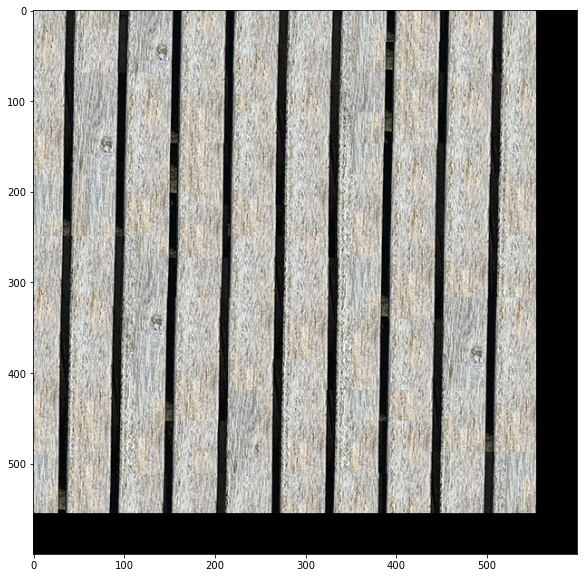

In [15]:
sample_img_fn = 'samples/table.jpg' 
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 600
patch_size = 45
overlap = 11
tol = 3
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

### part IV: Texture Transfer (30 pts)

In [16]:
def texture_transfer(sample, patch_size, overlap, tol, guidance_im, alpha):

    #create a new image with the size of out_size
    new_image = np.zeros((guidance_im.shape[0], guidance_im.shape[1], 3), dtype=sample.dtype)
    
    # X/Y size of my sample patch - used for calculations
    sample_size = sample.shape

    #How many iterations will I have to do of this patch size to fill in the image
    row_iterations = (guidance_im.shape[0] // (patch_size - overlap)) - 1
    column_iterations = (guidance_im.shape[1] // (patch_size - overlap)) - 1

    # Repeat this process every *iteration* times vertically and horizontally
    for r in range(row_iterations): # blocks of rows 
        for c in range(column_iterations): #blocks of columns
            # Take my patch by slicing the sample using my new random coordinates 
            last_pixel = sample_size[0] - patch_size - 1
            row_pixel_sample = random.randint(0, last_pixel)
            column_pixel_sample = random.randint(0, last_pixel)
            
            # This is the random patch
            random_patch = sample[row_pixel_sample:row_pixel_sample+patch_size,column_pixel_sample:column_pixel_sample+patch_size,:]
            
            if (r == 0): #this is the first row, so no overlap in the top
                row_pixel_sample_patch_start = r * patch_size
            else: #if this is not the first row, apply the overlap
                row_pixel_sample_patch_start = r * (patch_size - overlap)

            row_pixel_sample_patch_end = row_pixel_sample_patch_start + patch_size
            
            if (c == 0): # this is the first column, so no overlap to the left
                column_pixel_sample_patch_start = c * patch_size
            else: #if this is not the firt column, apply the overlap
                column_pixel_sample_patch_start = c * (patch_size - overlap)

            column_pixel_sample_patch_end = column_pixel_sample_patch_start + patch_size
            
            # The template is the patch in the current output image that is to be filled in
            template = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end]
            guidance_patch = guidance_im[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end]

            # Calculate the cost of sampling each patch. 
            # Don't need to do this in the upper-left corner, just the other ones 
            if not ((r==0) and (c==0)):
                mask = np.zeros((patch_size,patch_size), dtype=np.int)
                if (r > 0): 
                    # apply the mask on the top
                    mask[0:overlap,:] = 1
                if (c > 0):
                    #apply the mask on the left
                    mask[:,0:overlap] = 1
                
                ssd_overlap = ssd_patch(template, sample, mask)                
                ssd_guidance = ssd_patch(guidance_patch, sample, mask)
                ssd_total = alpha * ssd_overlap + (1 - alpha) * ssd_guidance
                
                half_patch_size = (int)((patch_size - 1) /2)
                a, b = choose_sample(ssd_total, tol, half_patch_size)
                
                a1 = a - half_patch_size
                b1 = b - half_patch_size
                new_patch = sample[a1:a1+patch_size,b1:b1+patch_size,:]
                
                if ((r > 0) and (c > 0)):
                    overlap_region = new_patch[0:patch_size:,0:patch_size]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_start + patch_size, column_pixel_sample_patch_start:column_pixel_sample_patch_start + patch_size]
                    existing[existing==0] = overlap_region[existing==0]
                elif (r > 0): 
                    # Horizontal overlap
                    overlap_region = new_patch[0:patch_size,:]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_start + patch_size,column_pixel_sample_patch_start:column_pixel_sample_patch_end]
                    existing[existing==0] = overlap_region[existing==0]
                    cost_r = (overlap_region[:,:,0] - existing[:,:,0]) ** 2
                    cost_g = (overlap_region[:,:,1] - existing[:,:,1]) ** 2
                    cost_b = (overlap_region[:,:,2] - existing[:,:,2]) ** 2
                    bndcost = cost_r + cost_g + cost_b
                    
                    horizontal_mask = cut(bndcost)
                elif (c > 0):
                    # vertical overlap
                    overlap_region = new_patch[:,0:patch_size]
                    existing = new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end ,column_pixel_sample_patch_start:column_pixel_sample_patch_start + patch_size]
                    existing[existing==0] = overlap_region[existing==0]
                    cost_r = (overlap_region[:,:,0] - existing[:,:,0]) ** 2
                    cost_g = (overlap_region[:,:,1] - existing[:,:,1]) ** 2
                    cost_b = (overlap_region[:,:,2] - existing[:,:,2]) ** 2
                    bndcost = cost_r + cost_g + cost_b

                    vertical_mask = cut(bndcost.T).T
                if ((r > 0) and (c > 0)):
                    cut_mask = np.logical_and(horizontal_mask, vertical_mask)
                    final_patch = existing.copy()
                    final_patch[cut_mask==1] = new_patch[cut_mask==1]
                elif (r > 0):
                    final_patch = existing.copy()
                    final_patch[horizontal_mask==1] = new_patch[horizontal_mask==1]
                elif (c > 0):
                    final_patch = existing.copy()
                    final_patch[vertical_mask==1] = new_patch[vertical_mask==1]

                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end, column_pixel_sample_patch_start:column_pixel_sample_patch_end] = final_patch
            else:
                new_image[row_pixel_sample_patch_start:row_pixel_sample_patch_end,column_pixel_sample_patch_start:column_pixel_sample_patch_end] = random_patch
    return new_image

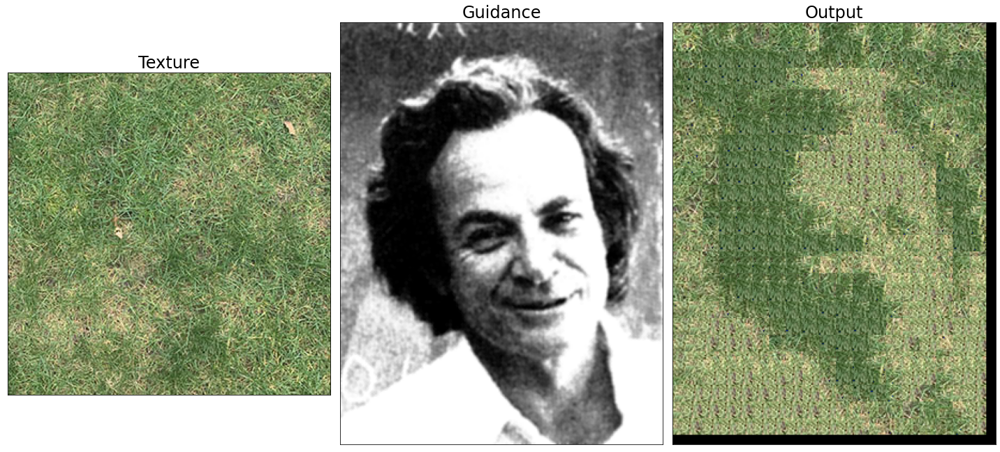

In [50]:
# load/process appropriate input texture and guidance images
texture_img_fn = 'samples/grass.jpg' 
guidance_img_fn = 'samples/feynman.tiff' 
texture_img = cv2.cvtColor(cv2.imread(texture_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)

patch_size = 25
overlap = 11
tol = 3
alpha = 0.5
res = texture_transfer(texture_img, patch_size, overlap, tol, guidance_img, alpha)

fig, axes = plt.subplots(1, 3, figsize=(20,20))
axes[0].imshow(texture_img)
axes[0].set_title('Texture', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(guidance_img)
axes[1].set_title('Guidance', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([]);
axes[2].imshow(res)
axes[2].set_title('Output', fontsize=24), axes[2].set_xticks([]), axes[2].set_yticks([]);
fig.tight_layout()


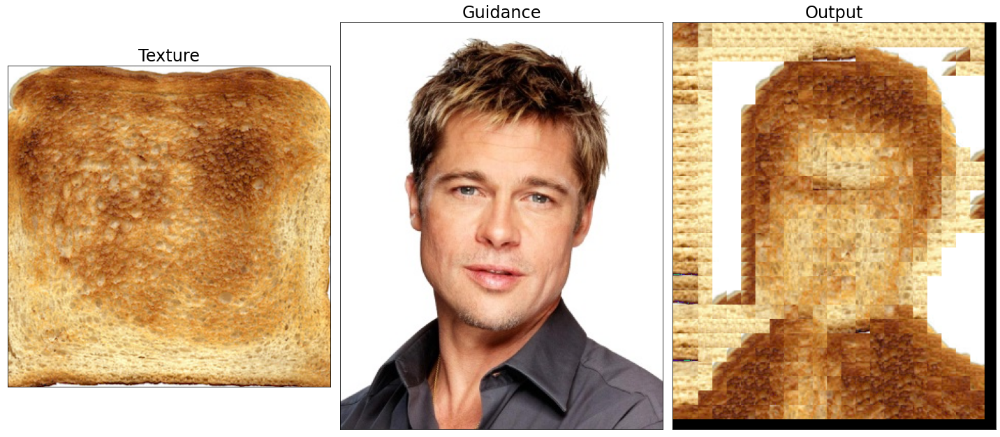

In [57]:
# load/process appropriate input texture and guidance images
texture_img_fn = 'samples/toast2.jpg' 
guidance_img_fn = 'samples/brad.jpg' 
texture_img = cv2.cvtColor(cv2.imread(texture_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)

patch_size = 25
overlap = 11
tol = 3
alpha = 0.5
res = texture_transfer(texture_img, patch_size, overlap, tol, guidance_img, alpha)

fig, axes = plt.subplots(1, 3, figsize=(20,20))
axes[0].imshow(texture_img)
axes[0].set_title('Texture', fontsize=24), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(guidance_img)
axes[1].set_title('Guidance', fontsize=24), axes[1].set_xticks([]), axes[1].set_yticks([]);
axes[2].imshow(res)
axes[2].set_title('Output', fontsize=24), axes[2].set_xticks([]), axes[2].set_yticks([]);
fig.tight_layout()

### Bells & Whistles

(10 pts) Create and use your own version of cut.m. To get these points, you should create your own implementation without basing it directly on the provided function (you're on the honor code for this one). 

You can simply copy your customized_cut(bndcost) into the box below so that it is easier for us to grade

(15 pts) Implement the iterative texture transfer method described in the paper. Compare to the non-iterative method for two examples.

(up to 20 pts) Use a combination of texture transfer and blending to create a face-in-toast image like the one on top. To get full points, you must use some type of blending, such as feathering or Laplacian pyramid blending.

(up to 40 pts) Extend your method to fill holes of arbitrary shape for image completion. In this case, patches are drawn from other parts of the target image. For the full 40 pts, you should implement a smart priority function (e.g., similar to Criminisi et al.).